In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import Birch, DBSCAN
from collections import Counter

In [10]:
tb_model = pd.read_parquet('data/tb_nyc_model.parquet')

In [12]:
def BIRCHSCAN(df, eps, min_samples, theta):
    # Fitting BIRCH
    birch_fit = Birch(threshold = eps * theta, branching_factor = min_samples, n_clusters=None)
    birch_fit.fit(df[['lat_meters', 'long_meters']])
    
    # Creating Subcluster Table (Sampled Locations)
    df["birch_subcluster"] = birch_fit.labels_
    tb_birch = pd.DataFrame(birch_fit.subcluster_centers_, columns = ['lat_meters', 'long_meters'])
    tb_birch["birch_subcluster"] = birch_fit.subcluster_labels_
    tb_birch["weights"] = tb_birch['birch_subcluster'].map(dict(Counter(birch_fit.labels_)))
    tb_birch["cluster_size_rank"] = tb_birch["weights"].rank(ascending=False)
    tb_birch["cluster_size_distrib"] = tb_birch["cluster_size_rank"]/tb_birch["cluster_size_rank"].max()
    tb_birch = tb_birch.dropna()
    tb_birch["eps"] = eps
    tb_birch["min_samples"] = min_samples
    tb_birch["theta"] = theta
    num_sample_cluster = sum(tb_birch["weights"] > min_samples)
    
    # Plotting resulting samples and original distribution
    fig, ax = plt.subplots(2, 2, figsize = (14, 14))
    sns.scatterplot(
        data = tb_birch, x = "long_meters", y = "lat_meters", 
        color = "black", size = "weights", 
        sizes = (2, 100), alpha =  0.5, ax = ax[0][0]
    )
    sns.scatterplot(
        data = df, 
        x = "long_meters", y = "lat_meters", 
        color = "black", alpha =  0.1, s = 1, ax = ax[0][1]
    )
    ax[0][0].set_title("Sampled Locations with Associated Weights")
    ax[0][1].set_title("Original Location Distribution")

    sns.scatterplot(
        data = tb_birch[tb_birch["weights"] > min_samples], x = "long_meters", y = "lat_meters", 
        color = "black", size = "weights", 
        sizes = (2, 100), alpha =  0.5, ax = ax[1][0]
    )
    sns.lineplot(
        data = tb_birch, x = "cluster_size_rank", y = "weights",
        color = "black", ax = ax[1][1]
    )
    ax[1][1].axhline(min_samples, color = "red", linestyle = "--")
    ax[1][0].set_title("Sampled Locations with Associated Weights (Core Samples)")
    ax[1][1].set_title("Sample Weight Distribution")
    ax[1][1].annotate(f"Core Samples\n{num_sample_cluster/tb_birch.shape[0]*100:.2f}%", xy = (num_sample_cluster, min_samples*2))
    fig.suptitle(f"Comparing Sampled & Original Locations\neps: {eps}, theta: {theta}, min_samples {min_samples}", fontsize = 16)
    fig.savefig(f"sample_explore/birch_{eps}_{min_samples}_{theta}.png")
    
    return tb_birch

In [ ]:
#

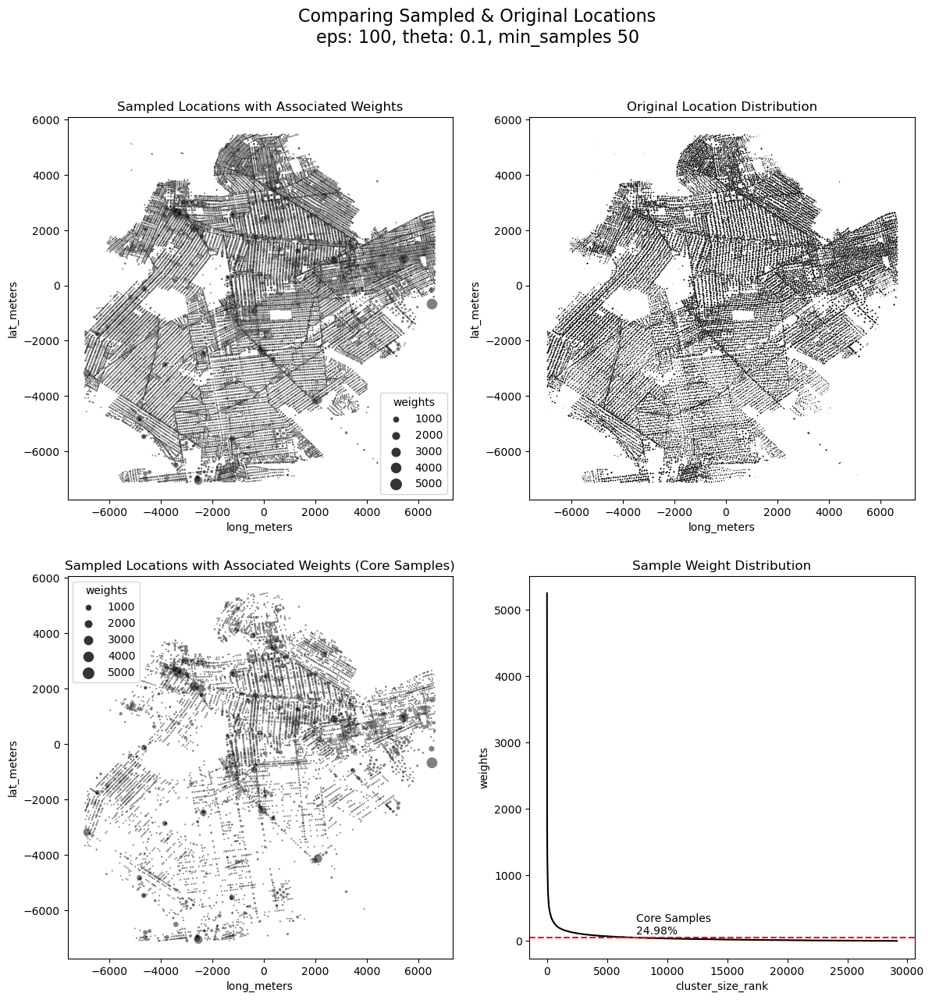

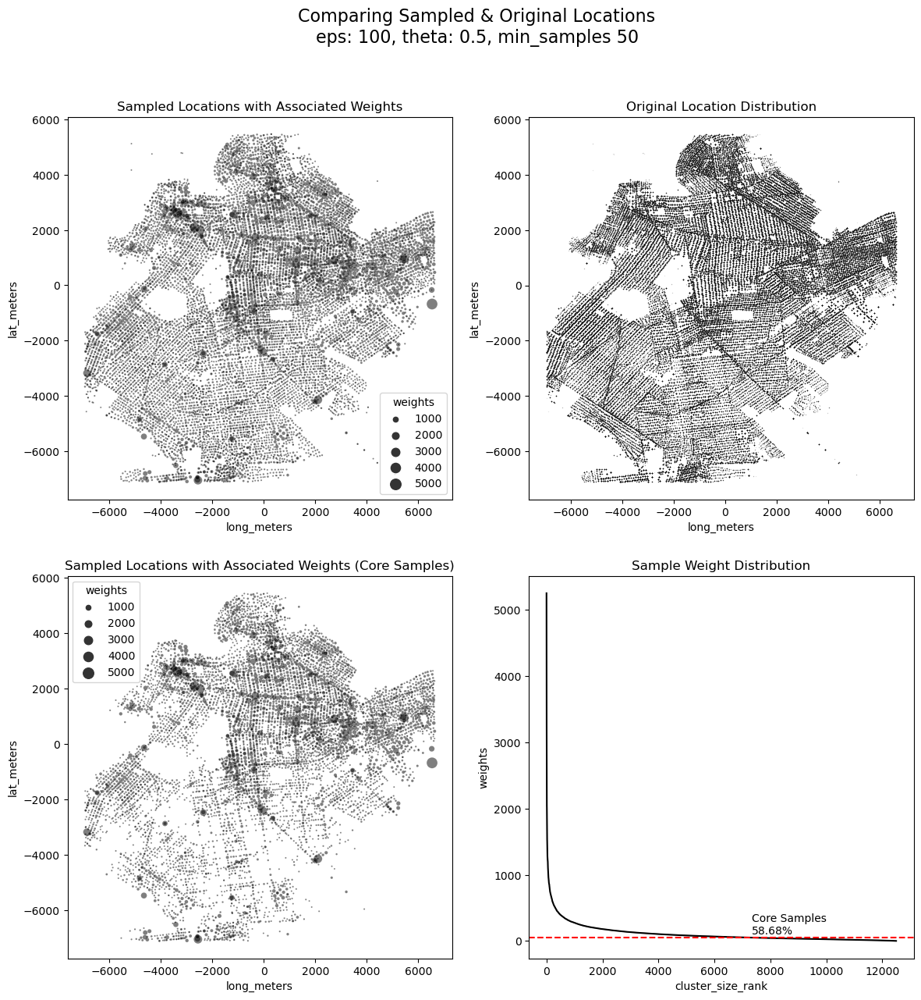

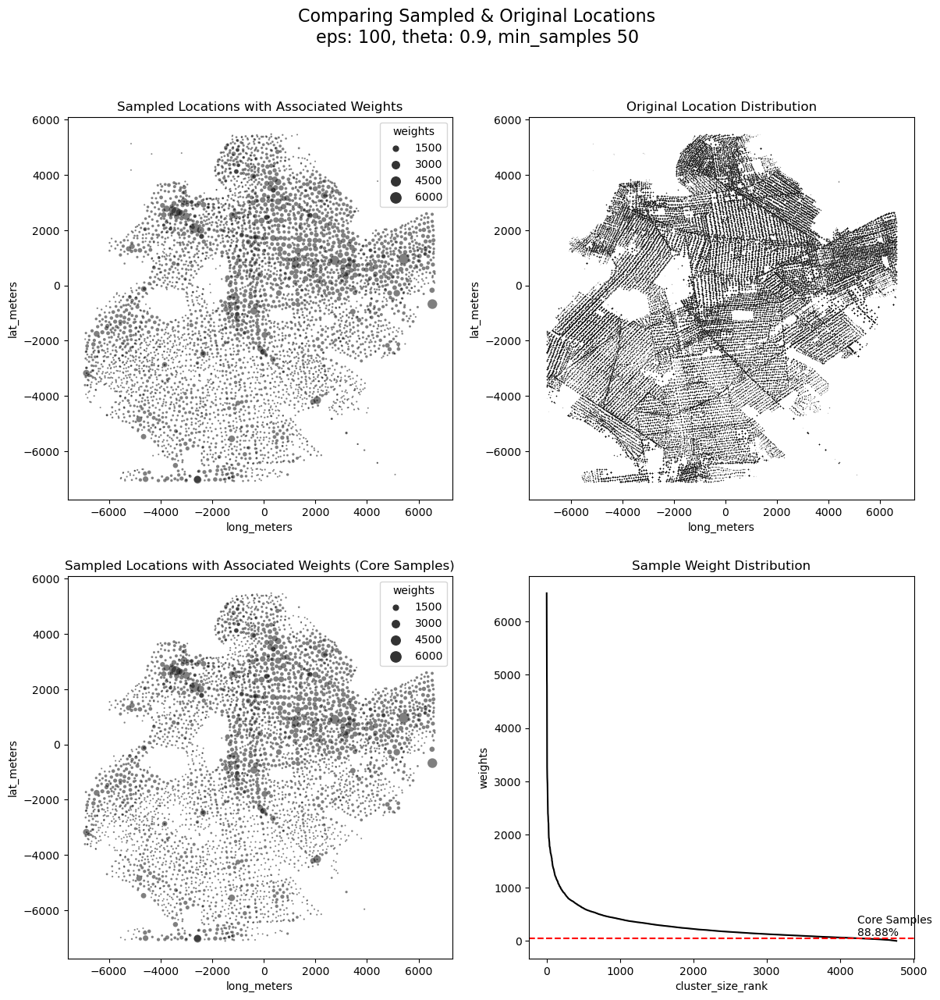

In [14]:
for theta in [0.1, 0.5, 0.9]:
    eps = 100
    min_samples = 50
    BIRCHSCAN(tb_model, eps, min_samples, theta)

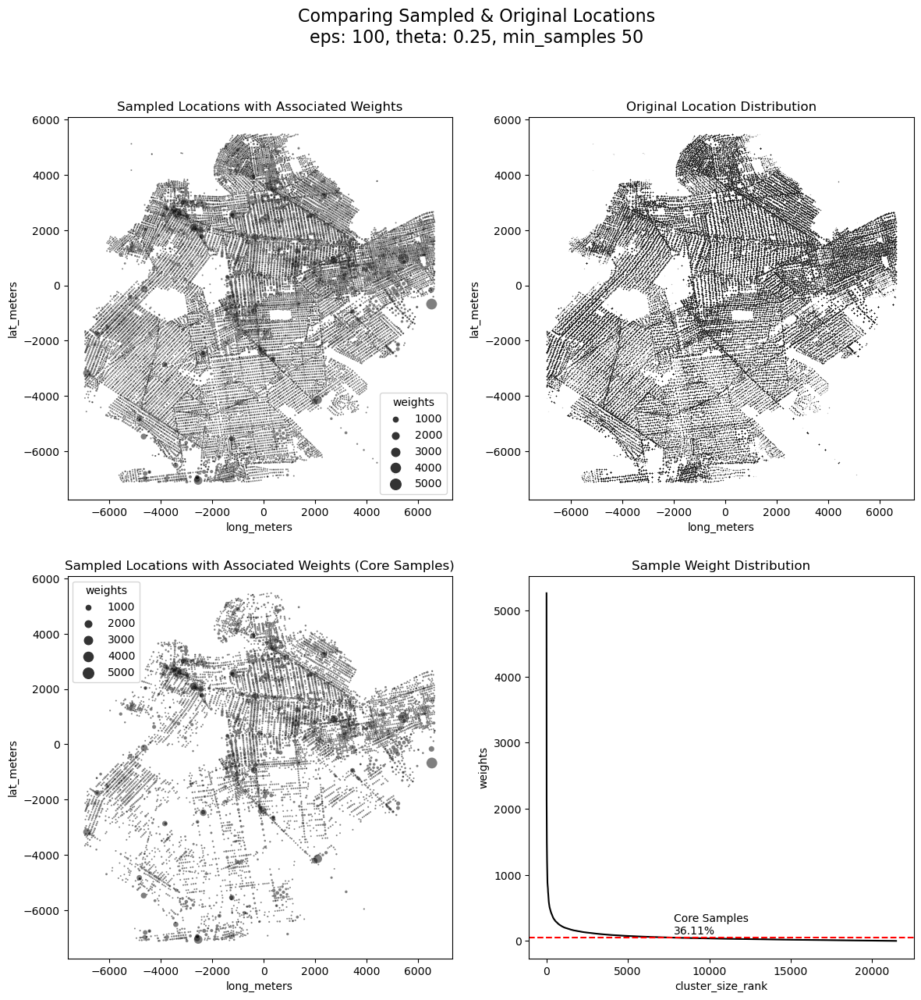

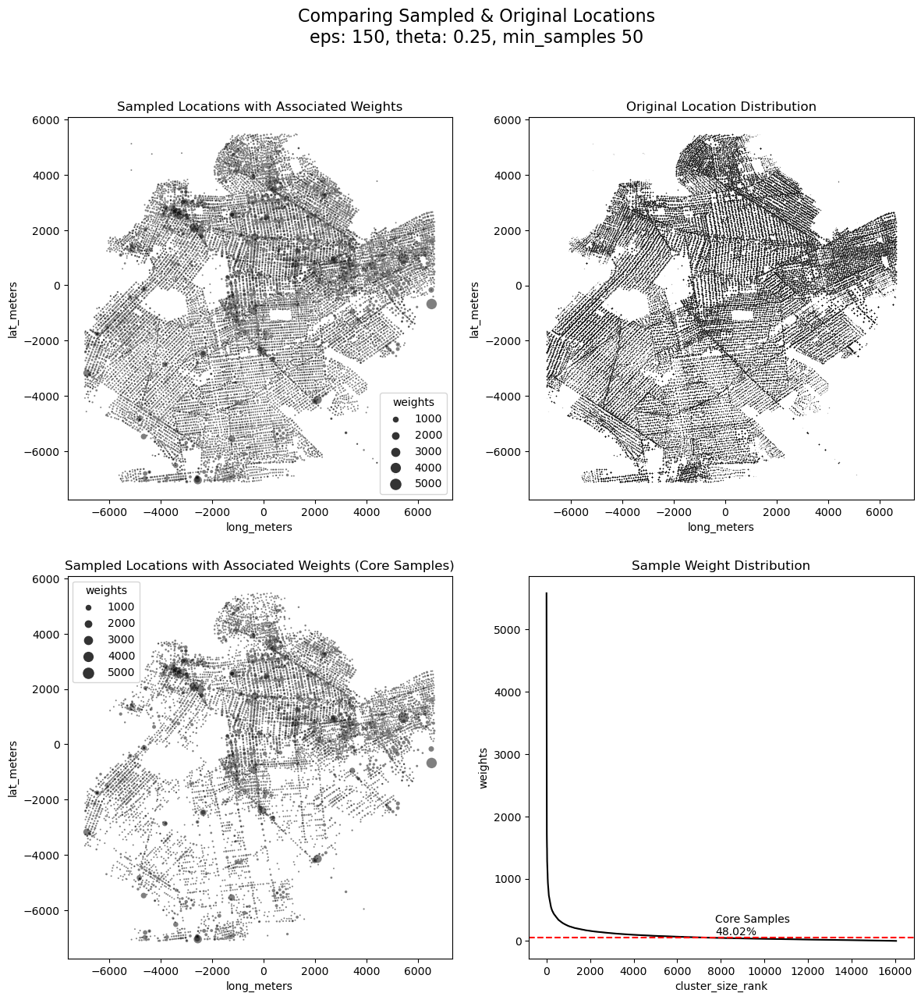

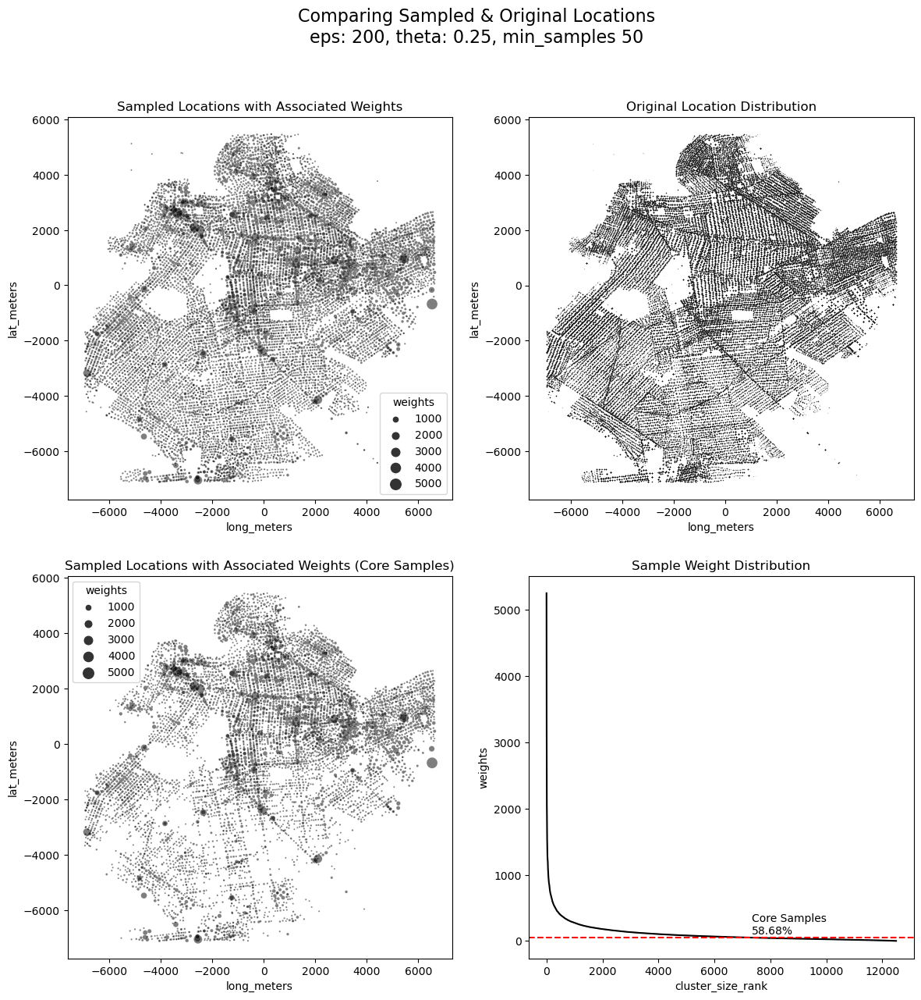

In [15]:
for eps in [100, 150, 200]:
    theta = 0.25
    min_samples = 50
    BIRCHSCAN(tb_model, eps, min_samples, theta)

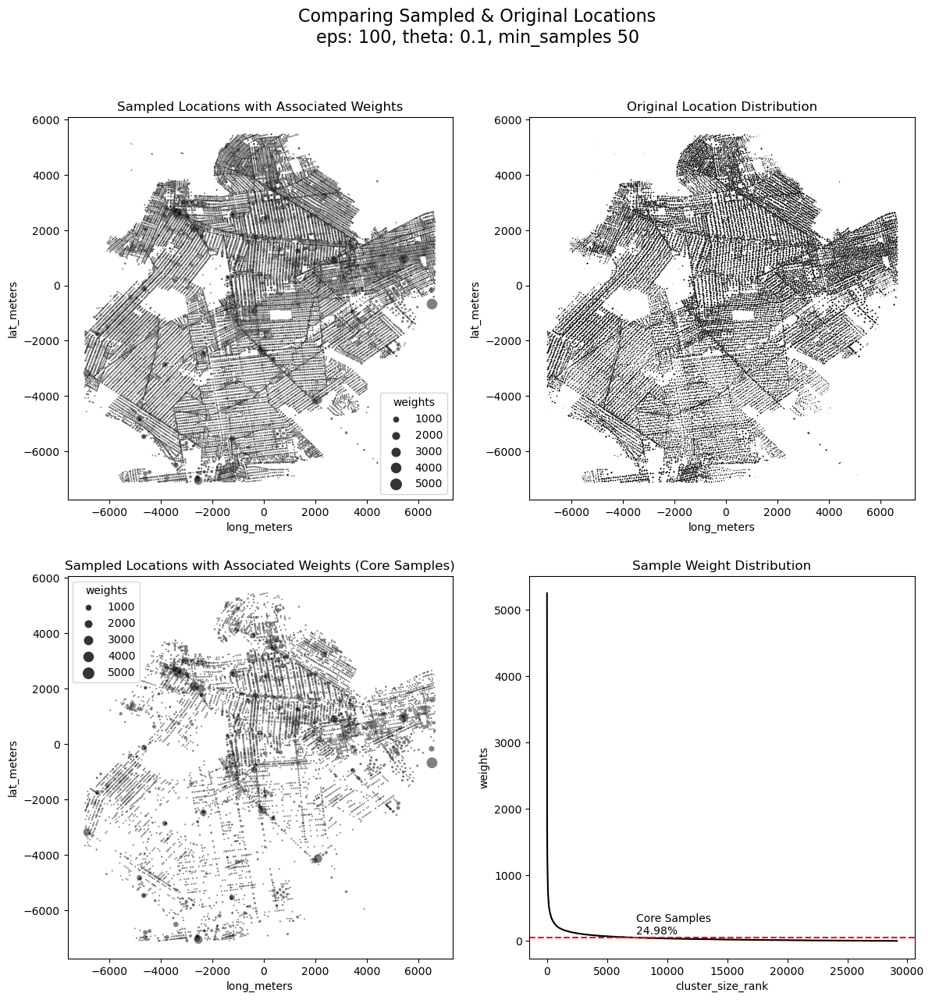

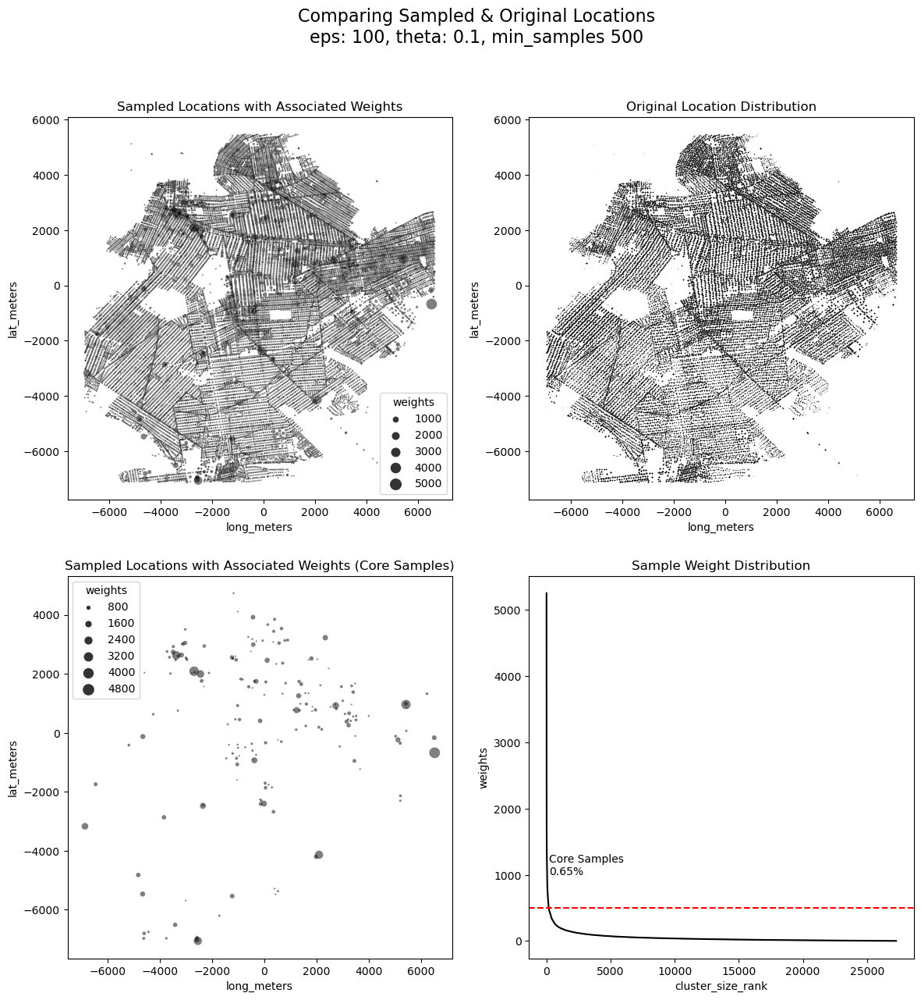

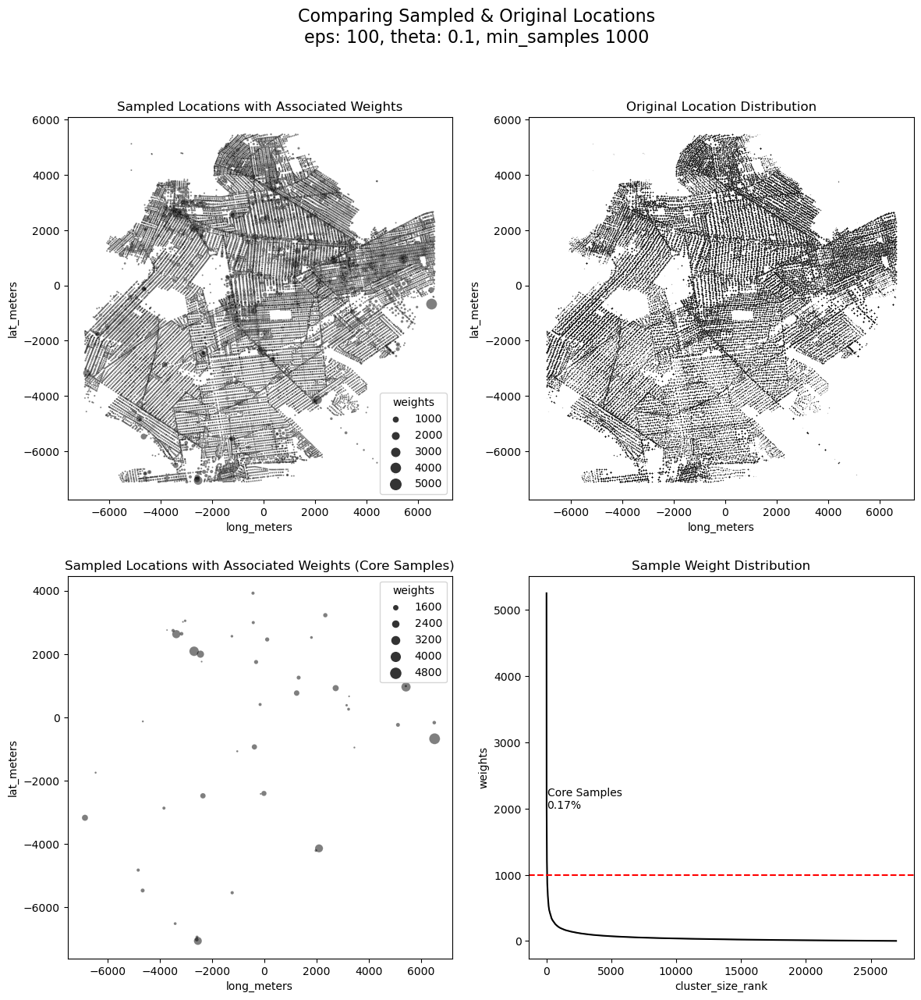

In [16]:
for min_samples in [50, 500, 1000]:
    theta = 0.1
    eps = 100
    BIRCHSCAN(tb_model, eps, min_samples, theta)